<a href="https://colab.research.google.com/github/Darius-BOUL/Kickstarter/blob/main/Kickstarter.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<hr style="border-width:2px;border-color:#75DFC1">
<center><h1>Statistiques Exploratoires</h1></center>
<center><h2>Analyse descriptive des variables numériques et qualitatives</h2></center>
<hr style="border-width:2px;border-color:#75DFC1">

In [16]:
import pandas as pd
import numpy as np

link = 'https://raw.githubusercontent.com/QuantikDataStudio/dataset/main/kickstarter.csv'
data = pd.read_csv(link, on_bad_lines='skip', index_col = 0)
data.head()

,name,category,main_category,currency,deadline,goal,launched,pledged,state,backers,country,usd pledged,usd_pledged_real,usd_goal_real;;
ID,,,,,,,,,,,,,,
1000002330,The Songs of Adelaide & Abullah,Poetry,Publishing,GBP,2015-10-09,1000.00,2015-08-11 12:12:28,0.00,failed,0,GB,0.0,0.00,1533.95;;
1000003930,Greeting From Earth: ZGAC Arts Capsule For ET,Narrative Film,Film & Video,USD,2017-11-01,30000.00,2017-09-02 04:43:57,2421.00,failed,15,US,100.0,2421.00,30000.00;;
1000004038,Where is Hank?,Narrative Film,Film & Video,USD,2013-02-26,45000.00,2013-01-12 00:20:50,220.00,failed,3,US,220.0,220.00,45000.00;;
1000007540,ToshiCapital Rekordz Needs Help to Complete Album,Music,Music,USD,2012-04-16,5000.00,2012-03-17 03:24:11,1.00,failed,1,US,1.0,1.00,5000.00;;
1000011046,Community Film Project: The Art of Neighborhoo...,Film & Video,Film & Video,USD,2015-08-29,19500.00,2015-07-04 08:35:03,1283.00,canceled,14,US,1283.0,1283.00,19500.00;;


Nettoyage de donées et supprissions des valeurs manquantes.

In [17]:
columns_to_drop = ['usd pledged', 'usd_pledged_real', 'usd_goal_real;;']
data = data.drop(columns=columns_to_drop)

In [18]:
data = data.dropna()

Cleaning et conversion.

In [19]:
data = data[~data['goal'].str.contains('-')].copy()
data['goal'] = data['goal'].astype(float)

In [20]:
data['pledged'] = data['pledged'].astype(float)
data['backers'] = data['backers'].astype(int)

On trie les données en ne conservant que les projets qui ont réussi ou échoués

In [23]:
data = data.loc[(data['state'] == 'failed') | (data['state'] == 'successful')]
data = data.sample(20000)

In [24]:
data.info();

<class 'pandas.core.frame.DataFrame'>
Index: 20000 entries, 1013505713 to 1012937016
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           20000 non-null  object 
 1   category       20000 non-null  object 
 2   main_category  20000 non-null  object 
 3   currency       20000 non-null  object 
 4   deadline       20000 non-null  object 
 5   goal           20000 non-null  float64
 6   launched       20000 non-null  object 
 7   pledged        20000 non-null  float64
 8   state          20000 non-null  object 
 9   backers        20000 non-null  int64  
 10  country        20000 non-null  object 
dtypes: float64(2), int64(1), object(8)
memory usage: 1.8+ MB


Je déterminer les variables numériques pour mes calcules statistiques.

In [26]:
num_data = data.select_dtypes(include=['int64','float64'])
num_data.head()

,goal,pledged,backers
ID,,,
1013505713,6500.0,70.0,1
1068074438,3000.0,4191.0,61
1117664037,350.0,377.0,26
102659429,2000.0,130.0,4
1110726752,495.0,1205.0,63


In [28]:
num_data.describe()

,goal,pledged,backers
count,2.000000e+04,2.000000e+04,20000.000000
mean,3.451086e+04,1.104753e+04,119.498150
std,4.495103e+05,1.102658e+05,1074.684484
min,1.000000e+00,0.000000e+00,0.000000
25%,2.000000e+03,4.600000e+01,2.000000
50%,5.000000e+03,7.485000e+02,14.000000
75%,1.500000e+04,4.645000e+03,62.000000
max,4.000000e+07,8.596475e+06,85581.000000


In [29]:
stats = pd.DataFrame(num_data.mean(), columns=['moyenne'])
stats.round(2)

,moyenne
goal,34510.86
pledged,11047.53
backers,119.50


In [30]:
pd.DataFrame(num_data.median(), columns=['median'])

stats['median'] = num_data.median()
stats['median']

,median
goal,5000.0
pledged,748.5
backers,14.0


Malgré une moyenne élevée, **on constate que la moitié des objectifs fixés ne dépassent pas 5500€**.

De même pour les dons récoltés et le nombre de contributeurs qui ont respectivement la moitié en dessous de 600€ et 12 personnes.

**Cela laisse apparaître la présence de valeurs extrêmes qui tirent vers le haut la moyenne.**

+ On observe déjà la faiblesse d'un indicateur comme la moyenne qui est fortement influencée par les valeurs extrêmes.

##Analyse descriptive des variables qualitatives

Je déterminer les variables catégorielles

In [32]:
cat_data = data.select_dtypes(include=['O'])

In [33]:
cat_data['main_category'].value_counts(normalize=True)

,proportion
main_category,
Film & Video,0.16980
Music,0.12650
Publishing,0.10450
Games,0.09295
Technology,0.08520
Art,0.08080
Design,0.07480
Food,0.06740
Fashion,0.05965


In [35]:
cat_data['main_category'].value_counts(normalize=True)

,proportion
main_category,
Film & Video,0.16980
Music,0.12650
Publishing,0.10450
Games,0.09295
Technology,0.08520
Art,0.08080
Design,0.07480
Food,0.06740
Fashion,0.05965


In [36]:
cat_data['main_category'].mode()

,main_category
0,Film & Video


Film & Video est la modalité la plus fréquente de main_category.

Dans ce jeu de données, nous disposons d'une variable binaire state qui renseigne sur la réussite ou l'échec de la collecte.
Ces variables sont généralement très intéressantes à étudier et livrent des informations précieuses sur les jeux de données. Il est important de bien les identifier et d'étudier dans un premier temps la fréquence des modalités.

In [37]:
cat_data['state'].value_counts(normalize=True)

,proportion
state,
failed,0.5967
successful,0.4033


On constate que 60% des collectes ont échouées.
Ce chiffre a peu d'intérêt si on ne le met pas en perspective avec le montant des objectifs fixés.
L'objectif est de faire une sorte de cartographie : 60% des collectes ont échoué mais quelles collectes sont concernées ? Les grosses ? Les petites ? Les deux ?

Tout d'abord dans une nouvelle variable goal_classes, découpez les montants cibles (goal) en 4 classes distinctes avec pour labels 0, 1, 2, 3 selon les 3 quantiles de la nouvelle variable créée.

In [38]:
data['goal_classes'] = pd.qcut(data['goal'], labels=[0, 1, 2, 3], q=4)

In [39]:
state_summary = data.groupby(['goal_classes', 'state']).size()
state_summary

<ipython-input-39-655c91d37bf7>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  state_summary = data.groupby(['goal_classes', 'state']).size()


goal_classes  state     
0             failed        2691
              successful    2872
1             failed        2684
              successful    2092
2             failed        2930
              successful    1930
3             failed        3629
              successful    1172
dtype: int64

In [40]:
state_summary = state_summary/data.groupby("goal_classes").size()

<ipython-input-40-5ac0bb1ae9ac>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  state_summary = state_summary/data.groupby("goal_classes").size()


state_summary affiche désormais les pourcentages de réussite ou d'échec suivant les quartiles où on se place.

In [41]:
state_summary

goal_classes  state     
0             failed        0.483732
              successful    0.516268
1             failed        0.561977
              successful    0.438023
2             failed        0.602881
              successful    0.397119
3             failed        0.755884
              successful    0.244116
dtype: float64

De manière purement analytique, nous avons décelé une information importante pour réussir son objectif de cagnotte : statistiquement, il semble qu'il ne faille pas fixer un objectif trop élevé à atteindre. Également, on remarquera que les campagnes qui sont un succès semblent réunir un nombre plus important de contributeurs.

On peut poser une question légitime : Peut-on avoir une idée du montant objectif (goal) à fixer pour optimiser ses chances de réussir ?

Toujours en utilisant groupby,agg exprimons les montants cibles (goal) médians, moyens, minimum et maximum en fonction de state dans un DataFrame target_goal.

In [42]:
target_goal = data.groupby(['state']).agg({'goal': ['median', 'mean', 'min', 'max']})
target_goal

goal                               
            median          mean  min         max
state                                            
failed      7000.0  51046.760769  1.0  40000000.0
successful  4000.0  10045.282589  1.0    950000.0

On peut en déduire que pour la réussite d'un projet le motant doit être d'environ 4000.

Il reste une dernière question importante à traiter : vers quelle(s) catégorie(s) dois-je me tourner si je souhaite maximiser ma collecte indépendamment de la réussir ou non ?
Pour répondre à cette question on utilisera les variables main_category,pledged,backers.

In [43]:
soluce = data.groupby(['main_category']).agg({'pledged': 'sum','backers': 'sum'})
soluce['pledged_per_backers'] = soluce['pledged']/soluce['backers']
soluce

,pledged,backers,pledged_per_backers
main_category,,,
Art,6571663.39,76983,85.365125
Comics,4609921.35,88251,52.236477
Crafts,1533321.62,16310,94.011135
Dance,722251.92,9639,74.930171
Design,42331658.14,407703,103.829646
Fashion,9507572.72,105926,89.756743
Film & Video,23691232.45,217823,108.763686
Food,9112955.99,90467,100.732377
Games,61125810.59,778477,78.519739


Il faut dorénavant répondre à cette question : y a-t-il dépendance ou indépendance entre les variables et dans quelle mesure ?

L'objectif est d'arriver à déterminer et mesurer les niveaux de corrélation entre les variables.

In [50]:
from scipy.stats import pearsonr

X = pd.DataFrame(pearsonr(data['backers'], data['pledged']), index=['pearson_coeff','p-value'], columns=['resultat_test'])
X

,resultat_test
pearson_coeff,0.772863
p-value,0.000000



> On peut vérifier cette relation également graphiquement.

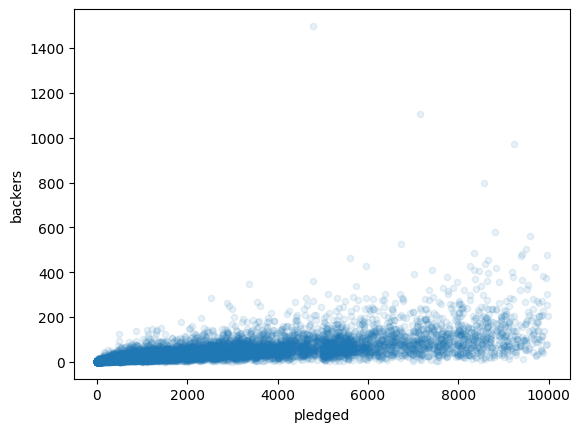

In [47]:
from pandas.plotting import scatter_matrix
%matplotlib inline

data[data['pledged']<10000].plot(kind='scatter', x='pledged', y='backers', alpha=0.1);

In [51]:
X.corr()


,resultat_test
resultat_test,1.0


Pour les variables quantitatives.

In [52]:
# Calcul des corrélations de Pearson sur les variables quantitatives
corr = X.corr()

# Affichage de la heatmap de ces corrélations
corr.style.background_gradient(cmap='Reds')

,resultat_test
resultat_test,1.000000


Pour les variables qualitatives.

Lorsque les variables sont qualitatives, un test de corrélation de Pearson n'est alors pas adapté. Pour cela, on commence par utiliser la table de contingence. On appelle une table de contingence, la table croisée contenant les différentes catégories des deux variables en question.

On commence par afficher la table de contingence de main_category par rapport à state.

In [54]:
table = pd.crosstab(data['main_category'],data['state'])
table

state,failed,successful
main_category,,
Art,881,735
Comics,250,373
Crafts,356,142
Dance,82,126
Design,883,613
Fashion,853,340
Film & Video,1938,1458
Food,969,379
Games,1035,824


Le test qu'on effectue alors est un test du χ2 par table de contingence

In [55]:
from scipy.stats import chi2_contingency

resultats_test = chi2_contingency(table)
statistique = resultats_test[0]
p_valeur = resultats_test[1]
degre_liberte = resultats_test[2]

print(statistique, p_valeur,degre_liberte)

893.4442516445133 1.0959666774863444e-181 14


Comme pour les variables quantitatives, on peut mesurer le niveau de corrélation entre deux variables qualitatives. Pour cela, on utilise le V de Cramer corrigé pour contrer le biais qui utilise les résultats du test du χ2.

In [57]:
def V_Cramer(table, N):
    stat_chi2 = chi2_contingency(table)[0]
    k = table.shape[0]
    r = table.shape[1]
    phi = max(0,(stat_chi2/N)-((k-1)*(r-1)/(N-1)))
    k_corr = k - (np.square(k-1)/(N-1))
    r_corr = r - (np.square(r-1)/(N-1))
    return np.sqrt(phi/min(k_corr - 1,r_corr - 1))

V_Cramer(table, data.shape[0])

0.2097006829012187

Le V_Cramer n'est pas très élevé.

On en déduit qu'il n'y a pas une forte corrélation entre les deux variables mais qu'elle n'est pas non plus négligeable.

> Une dernière étape consiste à étudier les relations entre variables quantitatives et qualitatives.
>
> Dans ce but, on utilisera l'analyse de la variance (**ANOVA**) à un facteur qui permet de comparer les moyennes d'échantillon. L'objectif de ce test est de conclure sur l'influence d'une variable explicative catégorielle sur la loi d'une variable continue à expliquer.

In [58]:
import statsmodels.api

result = statsmodels.formula.api.ols('pledged ~ main_category', data=data).fit()
table = statsmodels.api.stats.anova_lm(result)

table

,df,sum_sq,mean_sq,F,PR(>F)
main_category,14.0,2.100400e+12,1.500286e+11,12.438162,1.385892e-29
Residual,19985.0,2.410582e+14,1.206196e+10,NaN,NaN


Afin de conclure lors d'une analyse d'un test ANOVA, nous préfèrerons dire que  **"les modalités testées ont un effet statistique significatif sur la variable cible"**  plutôt que "pas indépendantes".

On aurrait faire cette étude plus simplement en utilisant des outils de profiling.

In [59]:
pip install ydata-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.9/390.9 kB 10.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 30.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 89.3 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=2f40c35a5fafb4714581131b43d4f358ec3c92361cd74b9b181d0893282a8385
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin


In [60]:
from ydata_profiling import ProfileReport

In [63]:
profile = ProfileReport(data, title="Report Kickstarter")

In [64]:
profile.to_widgets()

/usr/local/lib/python3.11/dist-packages/ydata_profiling/profile_report.py:528: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [65]:
profile.to_notebook_iframe()

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [66]:
profile.to_file("Report Kickstarter.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
from google.colab import files

# Télécharger le fichier HTML localement
files.download("Report Kickstarter.html")